# 2.1 
1.Can you explain why you may want to forecast the gas consumption in the future?

The first reason why we want to predict is to detect gas leakage as soon as possible. By predicting the gas consumption in the future, when the actual consumption is far above (>50) than the prediction, it is very likely that there is gas leakage of the system. This is very important since the cost of gas leakage is very huge and we should detect this leakage as soon as possible and act on it. Hence, when there is a possible leakage, we should let the smart meter send a warning to both the gas company and the user to validate the situation.

The second reason why we want to predict is that we can adjust the gas supply at particular period. By prediction, the gas company can anticipate what is period that is likely to experience high demand. With this information, the gas company can adjust their supply at particular period to fulfill the demand and to keep less waste at period when there is less demand.

The third reason is that we can use the prediction to detect if the smart gas meter is malfunctioning. When the actual meter reading and the prediction behave very different, there is potential that the samrt meter is broken. Since malfunctionning of the meter might cause dispute in the final bill, the company should detect this and send in technician to fix it as soon as possible.

2.Who would find this information valuable?

Both the company and the customers will find it valuable

3.What can you do if you have a good forecasting model?

We can integrate with an IoT system for gas leakage detection and alarm and meter malfunction detection. The gas company can also use this prediction as a reference for gas generation.

# 2.2 
In this section, we are building a prediction system using linear regression. To fit the data to the model, there are two processes that have been done. 

Data Preproccessing:

Firstly, the time series has been converted to numbers. This is done by setting the earliest time point of the whole data set as 0 and increment of 1 meaning 1 hour later than the earliest time point(time_min). In this way, we are able to deal with time-series. When prediction occurs, we need to convert the time number back to a time point by adding the time number with time_min. 

Secondly,in order to calculate consumption, we have initialize the first available reading of a particular id as the start point (consumption=0) and calculate consumption at particular time point by comparing the meter reading at that time with the reading at the start point. This is necessary as there are some id that has insufficient amount of data points and we want to replenish data of these id by comparing the id's consumption with other id's. If consumption is not extracted from original meter reading, it is not possible for us to have good replenishment for those data.

To train the model, since we have sufficient datas, the train to test ratio=9:1.

We only train data for id with more than 10 data points. Since if the id has too little data, the prediction model would be meaningless.

In [1]:
import pandas as pd
import numpy as np
import sklearn.linear_model as lm
import sklearn.model_selection as model_sel
import datetime as dt 
import matplotlib.pyplot as plt

In [2]:
gas_hr=pd.read_csv('hourly_readings_final.csv');
#id 6101 is dropped because it only has one data and there is no prediction can be done on one data point
gas_hr=gas_hr[gas_hr.dataid!=6101];

#Converting time varible to integer number
gas_hr.localminute = pd.to_datetime(gas_hr.localminute, infer_datetime_format = True,format = "%Y/%m/%d %I:%M:%S %p");
min_time=min(gas_hr['localminute']);
gas_hr.localminute=gas_hr.localminute.map(lambda x: (x-min_time).total_seconds()/3600.0);

In [3]:
id_list=gas_hr['dataid'].unique()
len(id_list)

156

In [4]:
normed_gas_hr=pd.DataFrame();
min_consump=[];

#Converting meter readings to consumption of all ids
for _id in id_list:
    gas_temp=gas_hr[gas_hr['dataid']==_id];
    min_consumption=min(gas_temp['meter_value']);
    gas_temp['meter_value']=gas_temp.meter_value.map(lambda x: x-min_consumption);
    min_consump.append(min_consumption);
    normed_gas_hr=normed_gas_hr.append(gas_temp);


/Users/Anvy/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


This cell is meant to detect those id whose amount of data is deemed as insufficient. We have set the threshold point of amount of data to 2000 (2 months). We have extracted a list of ids and will subsititue more data points later.Since the subsitituded data is not the real data, it will only be used for training but not testing.

(let say we are subsitituting data for id A)

Firstly, we only use that that is within id A's data range. For example, if A only has data of Dec in 2015, we will only compare other id's data which is within Dec in 2015. The reason for this is that in our model, we assume strong relation between time and reading. Since time is assumed deterministric to actual reading, we can only consider data within the same period.

Secondly, the meteric used to determine if the data of another id can be used is consumption. For different id, the reading of the start point might not be the same, even though the consumption might be the same. Hence, by comparing readings directly, it is very likely that the comparison is not accurate.

Logic for subsititution of data:(let say we are subsitituting data for id A) 1. find out the time range of id A. 2. Extract data for all other ids within the same range. 3. loop through all other ids. If for id B, the available data has range that is narrower than id A, narrow id A's range to that range. Generate gas consumption data of the particular period. Divide B's consumption by A's and compare the results(div_result). A soft margin is set to allow for some discripency of consumption. Two point from id A and B are considered matched if div_result=1 or div_result = NaN(NaN is output of 0/0) and 1-soft margin<=div_result<=1+soft_margin. Compute number of points that are matched and see if this number exceeds x%(acceptance_lvl) of total number of data within the period. If yes, subsititute these data as id A's data. The smaller the soft margin and the higher the acceptance level, the less but more fitted data will be subed. 

### Data Pre-processing

In [5]:
id_lack=[]
length=[]
thresh_length=2000;

#Determine what id need to be subed
for _id in id_list:
    gas_hr_id=gas_hr[gas_hr['dataid']==_id];
    length.append(len(gas_hr_id))
for index, item in enumerate(length):
    if((item<thresh_length) & (item>10)):
        id_lack.append(id_list[index]);
id_lack

[1403, 2755, 2814, 2946, 3036, 4671, 5317, 5545, 6673, 7566, 8244, 9160, 9600]

In [6]:
soft_margin=0.2;
acceptance_lvl=0.9;
#Create a varibale to store the subed data
normed_gas_hr_cp=pd.DataFrame(columns=['localminute','dataid','meter_value'])
for _id in id_lack:
    gas_lack_hr=normed_gas_hr[normed_gas_hr['dataid']==_id];
    time_min=min(gas_lack_hr['localminute']);
    time_max=max(gas_lack_hr['localminute']);
    
    #Extract id's who has data that is within time range we are looking for
    gas_compensate=normed_gas_hr[(normed_gas_hr['localminute']>=time_min) & (normed_gas_hr['localminute']<=time_max) 
                         &(normed_gas_hr['dataid']!=_id)];
    id_com=gas_compensate['dataid'].unique();
    
    #Loop through all candidate ids, searching for subsititution
    for c_id in id_com:
        #Find out the range of data for comparison and compute consumption based on readings
        gas_cid=pd.DataFrame();
        gas_cid=gas_compensate[gas_compensate['dataid']==c_id];
        min_consumption=min(gas_cid['meter_value']);
        gas_cid['meter_value']=gas_cid.meter_value.map(lambda x: x-min_consumption);
        gas_cid.reset_index(drop=True,inplace=True);
        
        #If id B has a smaller range than id A
        #Extract data from id A within the same range and compute for consumption
        time_min_c=min(gas_cid['localminute']);
        time_max_c=max(gas_cid['localminute']);
        gas_lack_c=pd.DataFrame();
        if((time_min_c!=time_min) | (time_max_c!=time_max)):
            gas_lack_c=gas_lack_hr[(gas_lack_hr['localminute']>=time_min_c) & (gas_lack_hr['localminute']<=time_max_c)];
            min_consumption=min(gas_lack_c['meter_value']);
            gas_lack_c['meter_value']=gas_lack_c.meter_value.map(lambda x: x-min_consumption);
        else:
            gas_lack_c=gas_lack_hr;
        gas_lack_c.reset_index(drop=True,inplace=True);
        
        #Compute difference between two data set by division
        diff_percent=gas_cid['meter_value']/gas_lack_c['meter_value'];
        #Find out the amount of matched data points
        equal_num=len(diff_percent[(diff_percent<=(1+soft_margin))&
                                   (diff_percent>=(1-soft_margin))])+len(diff_percent[np.isnan(diff_percent)]);
        
        #From the number of matched data points, determine if the data can be used as subsititution
        if(equal_num>=acceptance_lvl*len(gas_cid)):
            gas_cid.dataid=gas_cid.dataid.replace(c_id,_id);
            if(time_min_c!=time_min):
                temp_reading=gas_lack_hr[gas_lack_hr['localminute']==time_min_c]['meter_value'].values;
                extra_reading=temp_reading[0];
                gas_cid['meter_value']=gas_cid.meter_value.map(lambda x: x+extra_reading);
            normed_gas_hr_cp=normed_gas_hr_cp.append(gas_cid);
            
            

/Users/Anvy/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/Anvy/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/Anvy/anaconda/lib/python2.7/site-packages/pandas/core/generic.py:3110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable

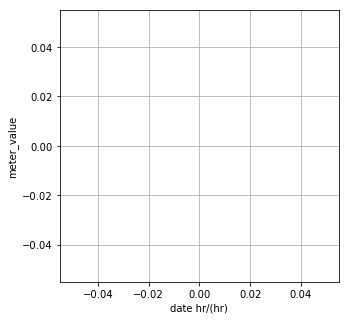

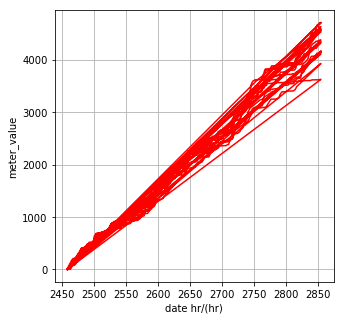

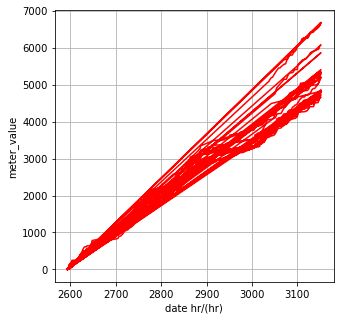

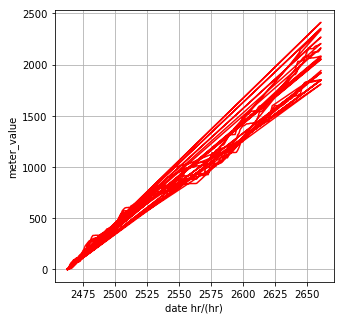

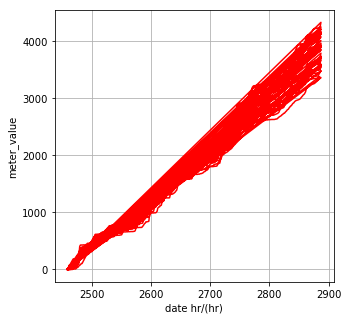

...

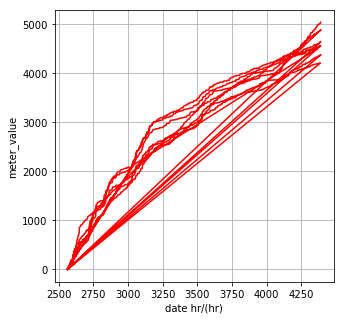

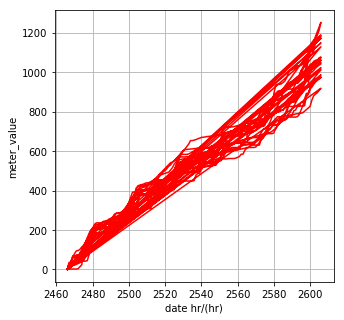

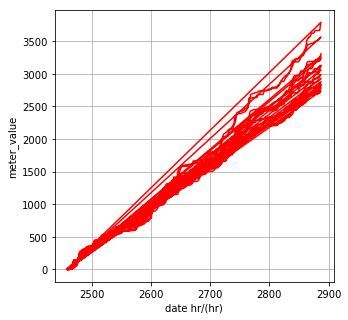

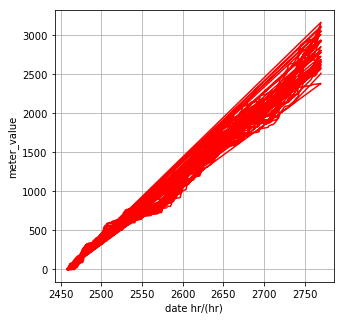

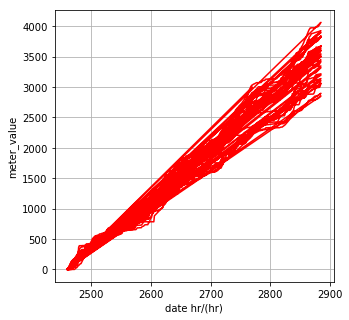

In [75]:
#Plots to see what has been subed for the lacking ids

# for _id in id_lack:
#     temp=normed_gas_hr_cp[normed_gas_hr_cp['dataid']==_id]
#     temp.reset_index(drop=True,inplace=True)
#     fig=plt.figure(figsize=(5,5));
#     plt.plot(temp.localminute,temp.meter_value,'r');
#     plt.xlabel('date hr/(hr)');
#     plt.ylabel('meter_value'),
#     plt.grid();
#     plt.show();

### Model Training

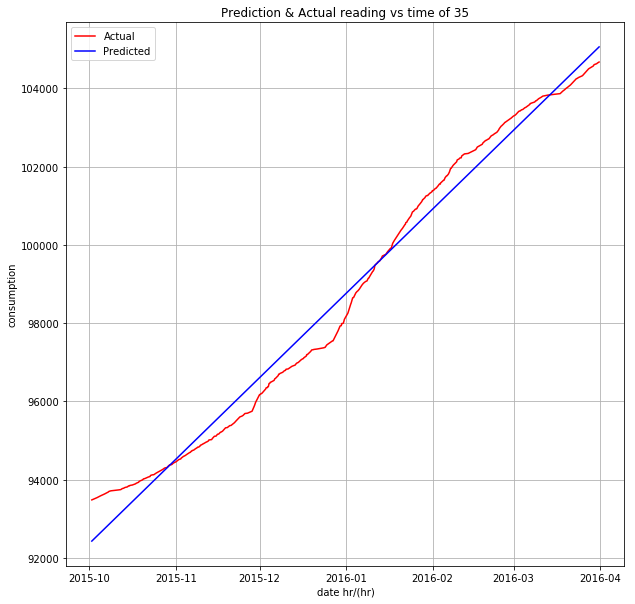

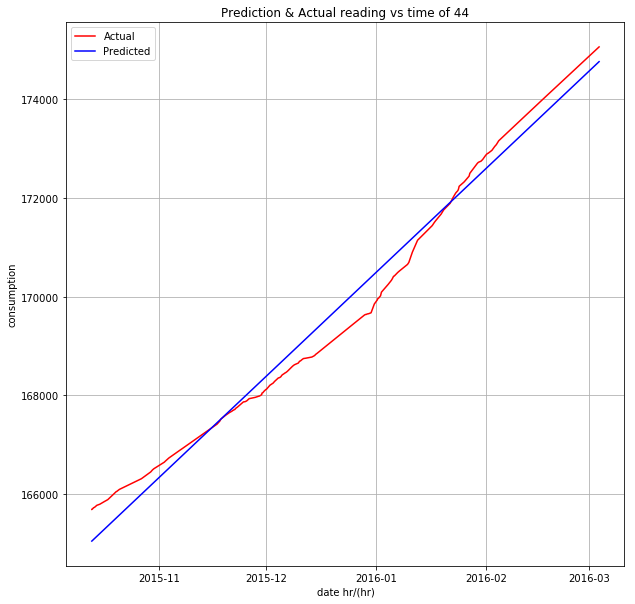

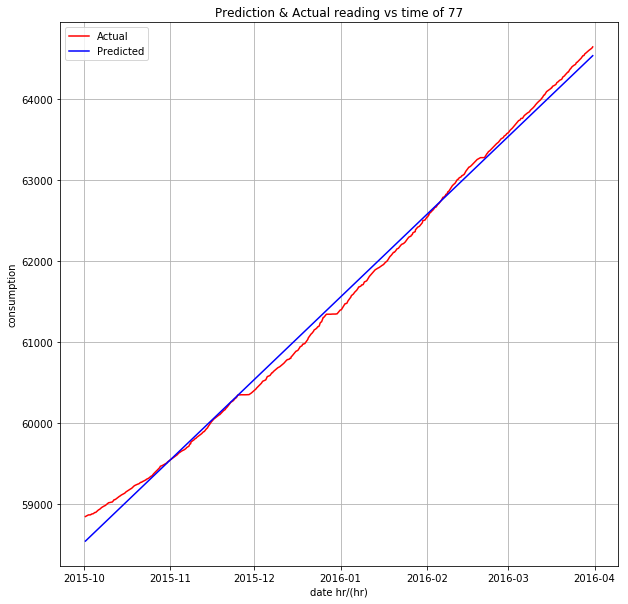

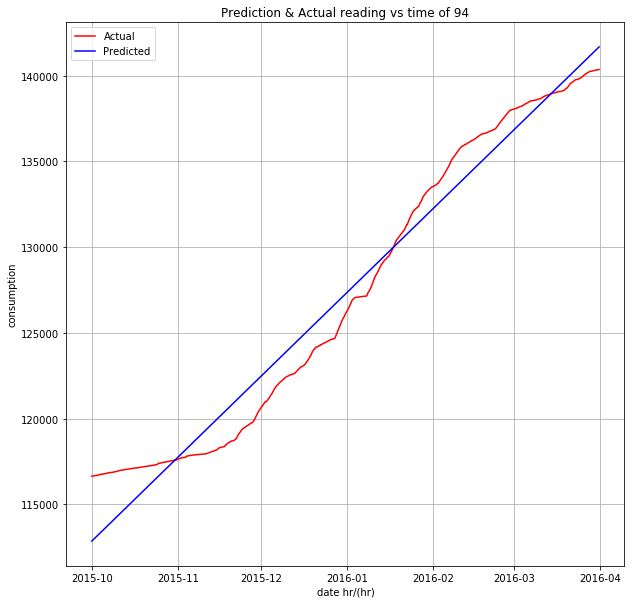

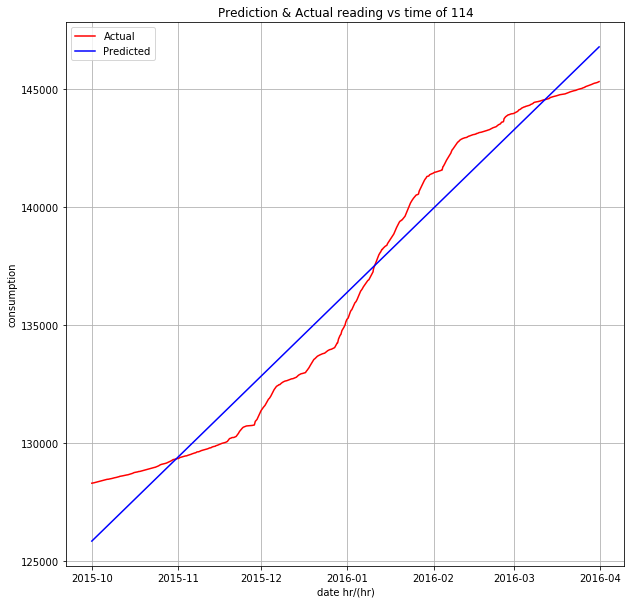

...

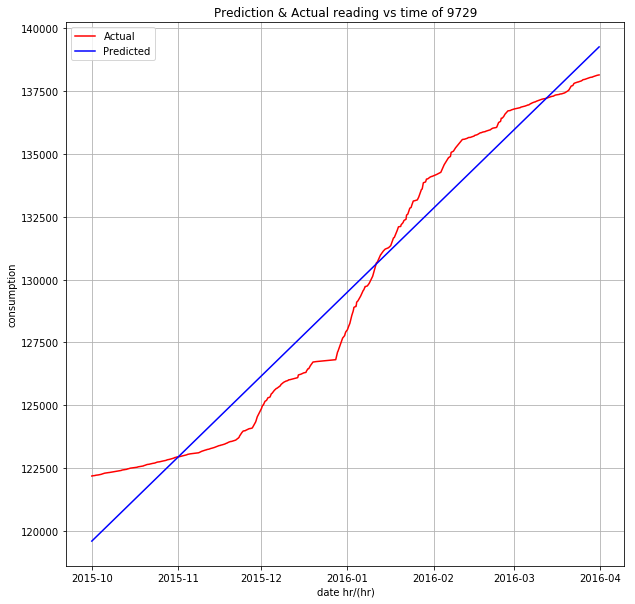

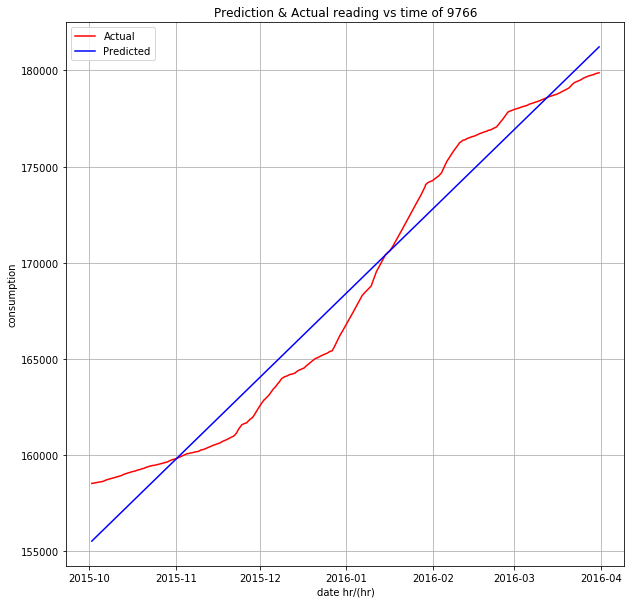

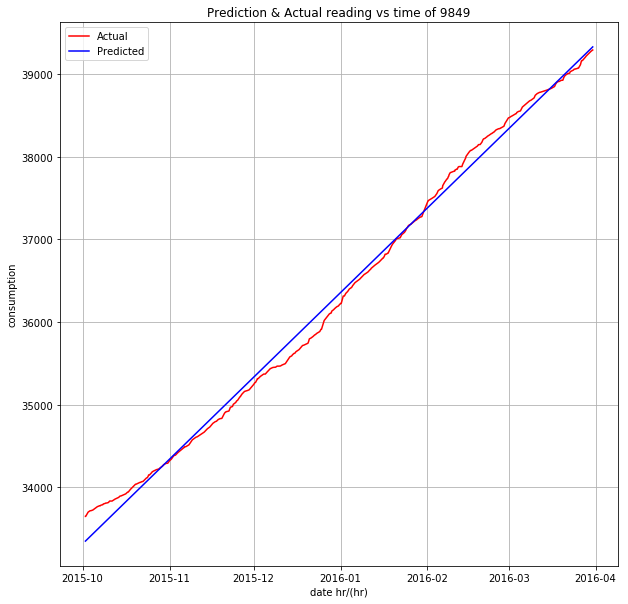

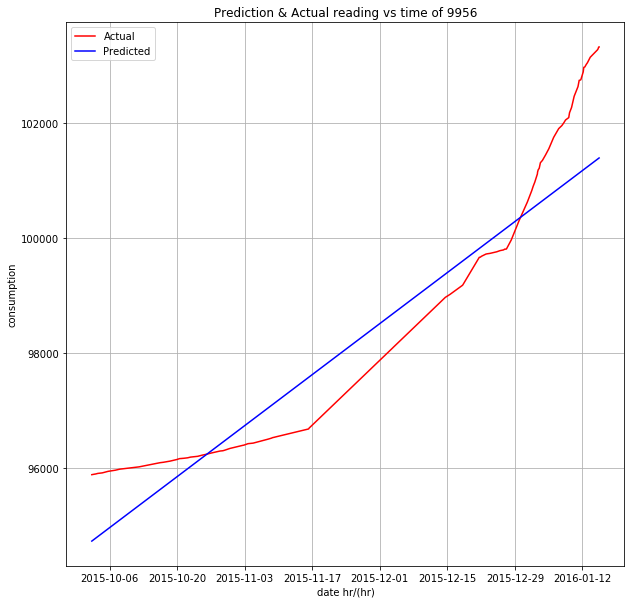

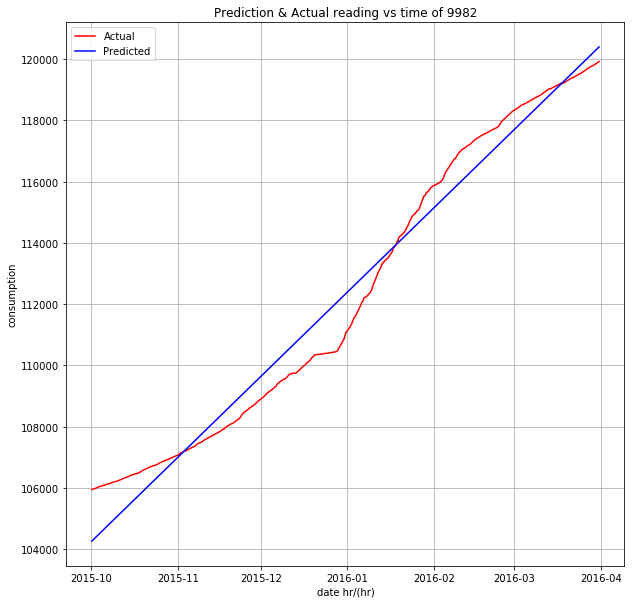

In [7]:
P_array=[];
score=[];
decre_index=0;
id_list1=[35]
all_result=pd.DataFrame(columns=['localminute','dataid','actual_reading','predicted_reading']);

for index,item in enumerate(id_list):
    #Extract attributes and wanted values
    X_temp=normed_gas_hr[normed_gas_hr['dataid']==item][['localminute']];
    Y_temp=normed_gas_hr[normed_gas_hr['dataid']==item][['meter_value']];
    #Split train and test case
    (X_train, X_test, Y_train, Y_test)=model_sel.train_test_split(X_temp,Y_temp,test_size=0.1);
    
    #For lacking ids add in more training data
    if(item in id_lack):
        X_train=X_train.append(normed_gas_hr_cp[normed_gas_hr_cp['dataid']==item][['localminute']]);
        Y_train=Y_train.append(normed_gas_hr_cp[normed_gas_hr_cp['dataid']==item][['meter_value']]);
    
    #only train for model has more than 10 data points, since the model will be more or less meaningless with 
    #very little amout of data
    if(len(X_temp)<10):
        P_array.append('not enough data');
        score.append('not enough data');
    else:
        #Training using LR model
        LR=lm.LinearRegression();
        predictor=LR.fit(X_train,Y_train);
        #Stor the trained predictor and the score of the prefictor for future use
        P_array.append(predictor)
        score.append(P_array[index].score(X_test,Y_test));
        #Predict for test data for comparison
        predicted=P_array[index].predict(X_test);
        
        #Convert back the time number to time point
        #Convert back consumption to meter readings
        X_test=X_test.localminute.map(lambda x: dt.timedelta(hours=x)+min_time);
        Y_test=Y_test.meter_value.map(lambda x:x+min_consump[index]);
        predicted=np.add(predicted,min_consump[index]);
        result=pd.DataFrame(columns=['localminute','dataid','actual_reading','predicted_reading']);
        result['localminute']=X_test;
        result['actual_reading']=Y_test;
        result['predicted_reading']=predicted;
        result['dataid']=item;
        result=result.sort_values(by='localminute');
        #Store the predicted result for plots in the next section
        all_result = all_result.append(result)
        
        #Plot of prediction vs actual reading against time
        fig=plt.figure(figsize=(10,10));
        t='Prediction & Actual reading vs time of '+str(item)
        plt.plot(result.localminute,result.actual_reading,'r',label='Actual');
        plt.plot(result.localminute,result.predicted_reading,'b',label='Predicted');
        plt.legend()
        plt.xlabel('date hr/(hr)');
        plt.ylabel('consumption');
        plt.title(t,loc='center');
        plt.grid();
        plt.show();
        

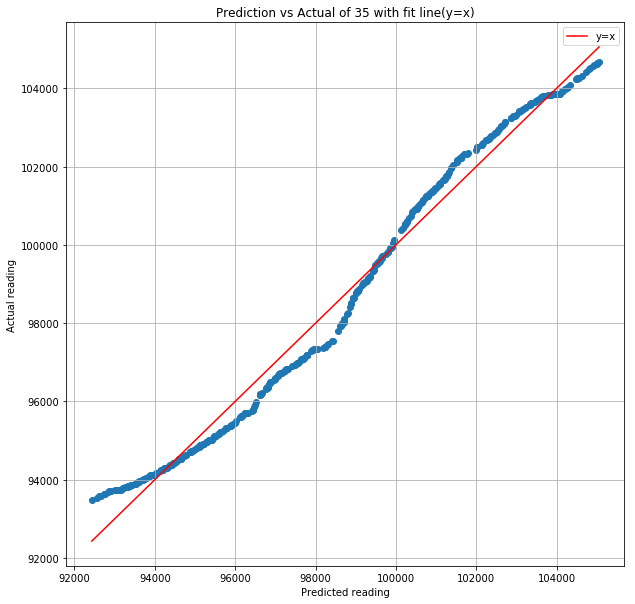

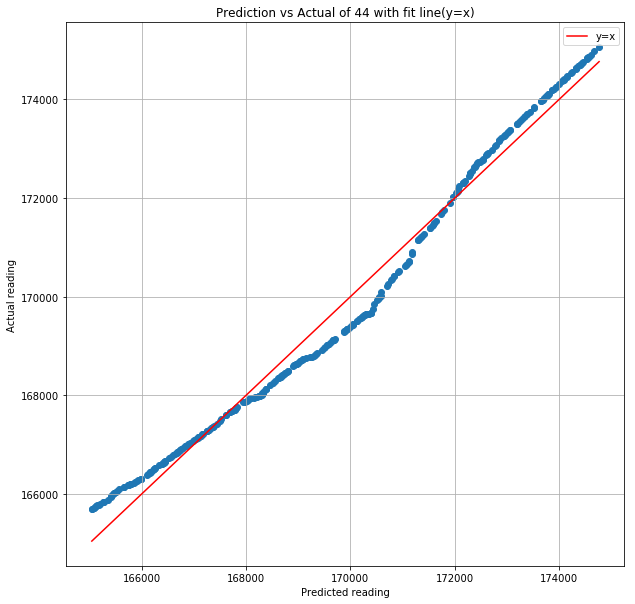

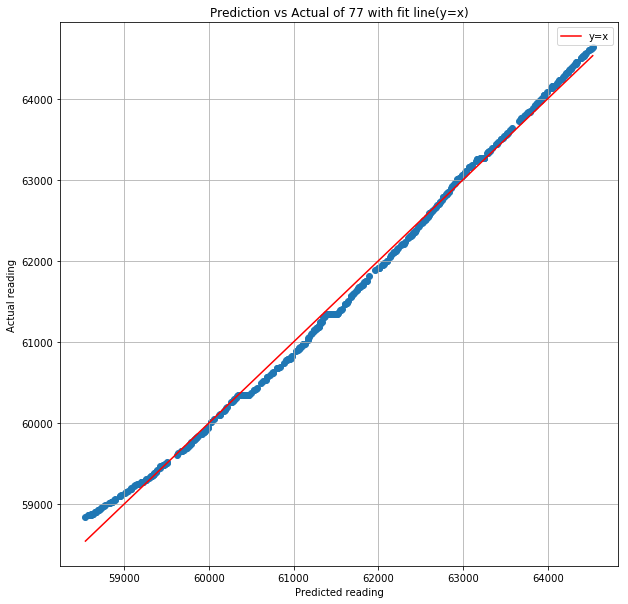

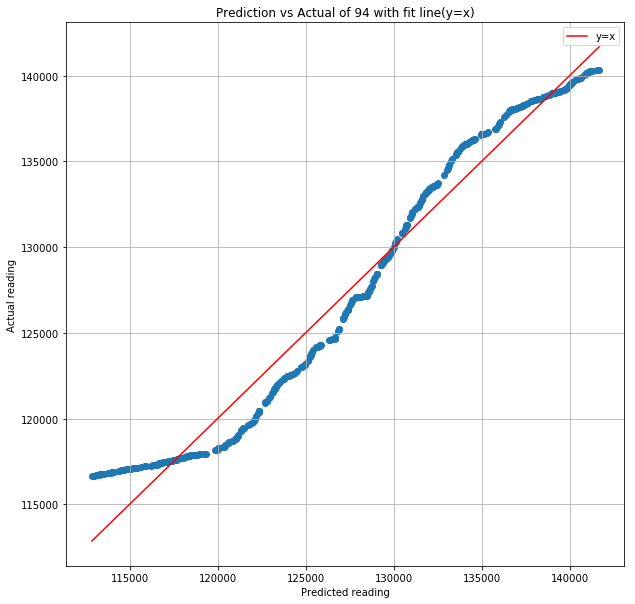

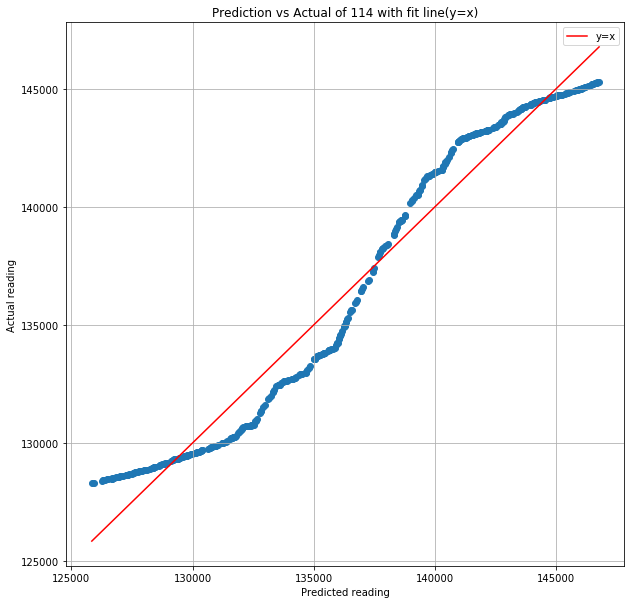

...

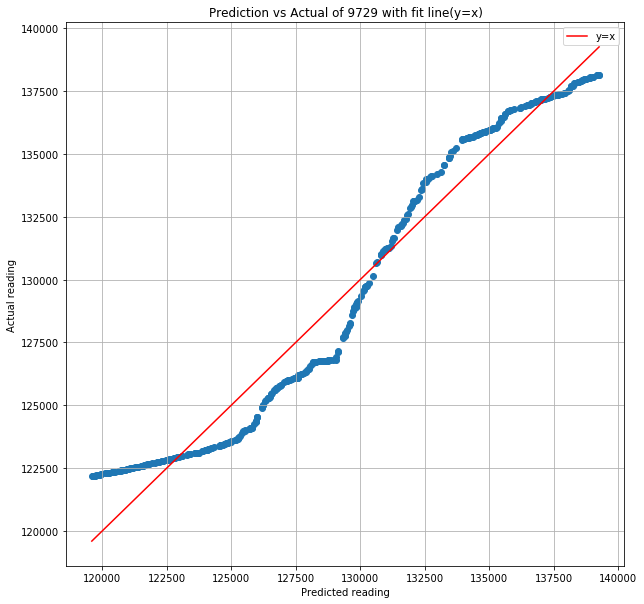

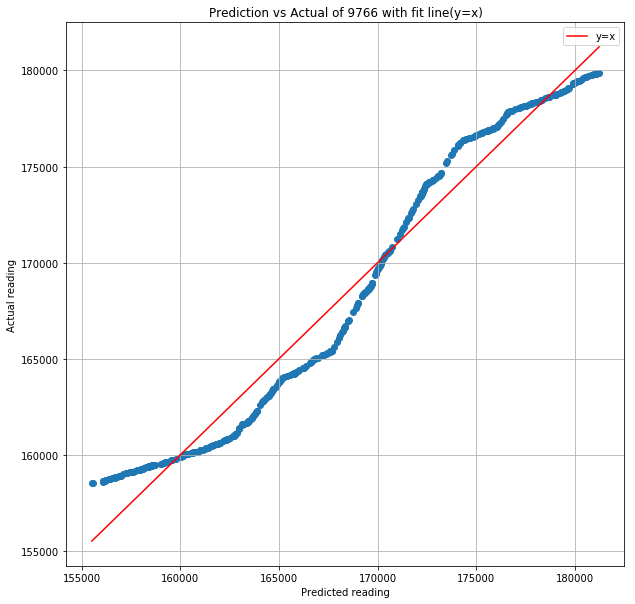

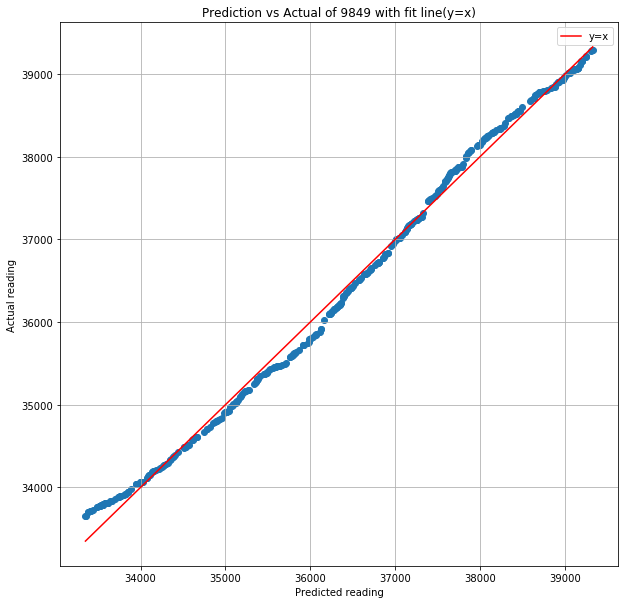

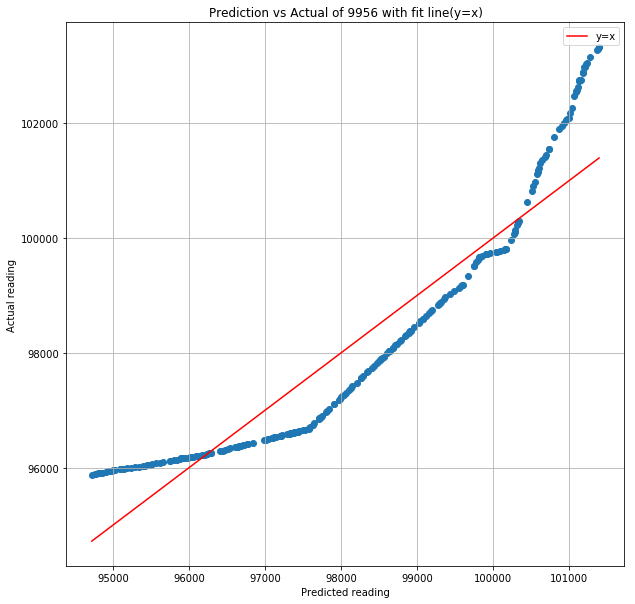

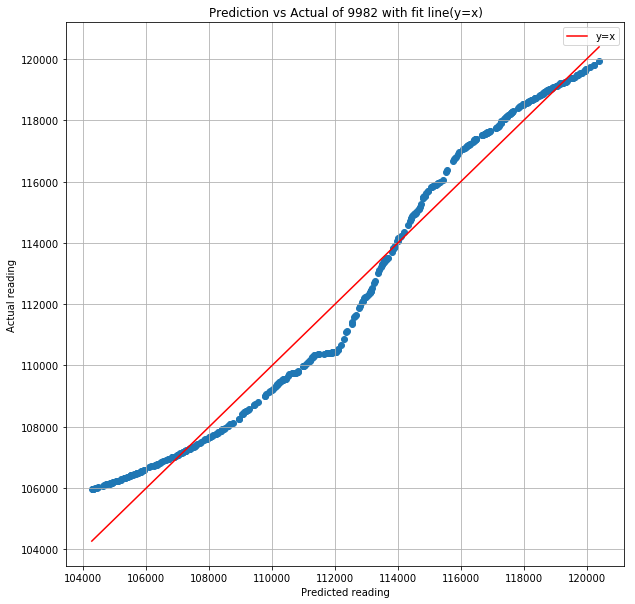

In [8]:
#Scatter plot of prediction vs actual reading
valid_id=all_result['dataid'].unique()
for _id in valid_id:
    temp=all_result[all_result['dataid']==_id];
    fig=plt.figure(figsize=(10,10));
    t='Prediction vs Actual of '+str(_id)+' with fit line(y=x)'
    plt.scatter(temp.predicted_reading.tolist(),temp.actual_reading.tolist());
    plt.plot(temp.predicted_reading,temp.predicted_reading,'r',label='y=x')
    plt.legend();
    plt.xlabel('Predicted reading');
    plt.ylabel('Actual reading');
    plt.title(t,loc='center');
    plt.grid();
    plt.show();
    

## Conclusion

As seen from the plots, the performance of the LR predictor is not very good. That is mainly because many id's consumption pattern is not linear in nature, but rather looks like a polynomial. Since by applying LR to predict, the outcome is not very satisfactory. 